In [1]:
%load_ext autoreload
%autoreload 2

import os
import sys
if not os.getcwd() == '/NN_project':
    os.chdir('..')

import tensorflow as tf
from tensorflow import keras
import numpy as np
from tensorflow.keras import backend as K
import matplotlib.pyplot as plt
import pandas as pd
from datetime import datetime

pd.set_option("display.max_columns", 101)

tensorboard_logs_dir = 'gcloud/logs/TensorBoard/'
logs = 'gcloud/logs/log.json'

In [2]:
pickle_file_test = 'data/preprocessed/VOC2012/preprocessed_test.pkl'
df_test = pd.read_pickle(pickle_file_test)

In [3]:
df_logs = pd.read_json(logs, lines=True)
df_logs = df_logs.join(pd.io.json.json_normalize(df_logs['parameters']))
df_logs = df_logs.join(pd.io.json.json_normalize(df_logs['val_metrics']))
df_logs = df_logs.drop(['parameters', 'val_metrics'], axis=1)
df_logs

,log_name,optimizer,learning_rate,epochs,batch_size,loss_koef_negative_box,loss_koef_position,loss_koef_size_coef,batch_normalization,regularization.l1,regularization.l2,loss,precision,recall
0,2019-11-30-09-42-27,adam,0.0010,30,64,0.15,5.0,5.0,NaN,NaN,NaN,1.731629,0.413670,0.354748
1,2019-11-30-10-23-58,adam,0.0010,30,64,0.20,5.0,5.0,NaN,NaN,NaN,1.705130,0.505143,0.294821
2,2019-11-30-11-05-08,adam,0.0010,30,64,0.25,5.0,5.0,NaN,NaN,NaN,1.811627,0.575696,0.263776
3,2019-11-30-11-46-23,adam,0.0010,30,64,0.30,5.0,5.0,NaN,NaN,NaN,1.784226,0.592904,0.244385
4,2019-11-30-12-27-19,adam,0.0010,30,64,0.35,5.0,5.0,NaN,NaN,NaN,1.873222,0.646945,0.172767
5,2019-11-30-13-08-27,adam,0.0010,30,64,0.40,5.0,5.0,NaN,NaN,NaN,1.799761,0.659126,0.220514
6,2019-11-30-13-49-20,adam,0.0010,30,64,0.45,5.0,5.0,NaN,NaN,NaN,1.915182,0.598028,0.218890
7,2019-11-30-14-30-22,adam,0.0010,30,64,0.50,5.0,5.0,NaN,NaN,NaN,1.842360,0.639888,0.195688
8,2019-12-01-09-57-43,adam,0.0010,50,64,0.10,5.0,5.0,NaN,NaN,NaN,1.693759,0.449323,0.312812
9,2019-12-01-11-14-48,adam,0.0010,20,64,0.20,5.0,5.0,NaN,NaN,NaN,1.732050,0.442305,0.360035


In [4]:
df_metrics = df_logs[['log_name','loss', 'precision', 'recall']]
df_metrics['f1'] = 2*df_metrics['precision'] * df_metrics['recall'] / (df_metrics['precision'] + df_metrics['recall'])
df_metrics.sort_values('f1', ascending=False).head(20)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,log_name,loss,precision,recall,f1
39,2019-12-08-14-31-14,1.637840,0.507715,0.486912,0.497096
27,2019-12-06-14-08-11,1.579499,0.510905,0.467248,0.488102
28,2019-12-06-15-11-27,1.621716,0.477881,0.496569,0.487046
26,2019-12-06-12-59-09,1.676631,0.462007,0.512261,0.485838
35,2019-12-07-19-42-51,1.572125,0.504428,0.468370,0.485730
40,2019-12-08-16-41-23,1.659345,0.455955,0.501877,0.477815
33,2019-12-07-14-54-42,1.725575,0.511968,0.445941,0.476679
34,2019-12-07-17-03-09,1.750826,0.446500,0.500717,0.472057
29,2019-12-06-16-14-08,3.265890,0.463109,0.472402,0.467709
37,2019-12-08-08-52-46,1.746269,0.402939,0.533732,0.459204


In [4]:
%load_ext tensorboard
%tensorboard --logdir gcloud/logs/TensorBoard/ --bind_all

In [5]:
#log_name='2019-12-06-15-11-27'#good
#log_name='2019-12-06-12-59-09' #not bad
#log_name = '2019-12-06-14-08-11'
#log_name = '2019-12-07-19-42-51'
log_name = '2019-12-08-14-31-14' # best f1
#log_name = '2019-12-08-16-41-23'

has_min_loss = False 

config_file = 'gcloud/logs/configs/{}.yaml'.format(log_name)
model_weights = 'gcloud/models/{}.h5'.format(log_name)

if has_min_loss:
     model_weights_min_loss = 'gcloud/models/{}_min_loss.h5'.format(log_name)

In [6]:
from src.config import Config
config = Config(config_file)

{'BATCH_SIZE': 64, 'EPOCHS': 30, 'INPUT_SIZE': '(256,256)', 'CONV_BASE_SIZE': 32, 'DENSE_SIZE': 1024, 'ACTIVATION': <tensorflow.python.keras.layers.advanced_activations.LeakyReLU object at 0x7fd350fe7a90>, 'LEARNING_RATE': 0.0001, 'OPTIMIZER': <tensorflow.python.keras.optimizer_v2.adam.Adam object at 0x7fd2c4ce5710>, 'L1': 0, 'L2': 0.0003, 'REGULARIZER': <tensorflow.python.keras.regularizers.L1L2 object at 0x7fd2c4ce58d0>, 'BATCH_NORMALIZATION': False, 'YOLO_LAYERS_COUNTS': [2, 4, 4, 4], 'LOSS_NEGATIVE_BOX_COEF': 0.07, 'LOSS_POSITION_COEF': 5, 'LOSS_SIZE_COEF': 5, 'TRAIN_TEST_SPLIT': 0.1, 'VALIDATION_SPLIT': 0.1}


/NN_project/src/config.py:12: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  cfg = yaml.load(ymlfile)


In [7]:
from src.models.YOLOv3 import create_model
model = create_model(config)
model.load_weights(model_weights)

if has_min_loss:
    model_min_loss = create_model(config)
    model_min_loss.load_weights(model_weights_min_loss)

## Performance on test data

In [8]:
from src.models.DataGen import DataGenGrid
from src.models.metrics import precision, recall, true_positives, false_negative, positives
from src.models.losses import SumSquaredLoss
datagen = DataGenGrid()

loss = SumSquaredLoss(config.GRID_SIZE, config.LOSS_NEGATIVE_BOX_COEF, config.LOSS_POSITION_COEF, config.LOSS_SIZE_COEF)

print('Last Epoch model:')
pred = model.predict_generator(datagen.flow_test(df_test))
print('LOSS',K.mean(loss(K.constant(np.stack(df_test['grid_output'].values)), K.constant(pred))))
print('PRECISION',K.mean(precision(K.constant(np.stack(df_test['grid_output'].values)), K.constant(pred))))
print('RECALL', K.mean(recall(K.constant(np.stack(df_test['grid_output'].values)), K.constant(pred))))

if has_min_loss:
    print()
    print('Minimal validation loss model:')
    pred = model_min_loss.predict_generator(datagen.flow_test(df_test))
    print('LOSS',K.mean(loss(K.constant(np.stack(df_test['grid_output'].values)), K.constant(pred))))
    print('PRECISION',K.mean(precision(K.constant(np.stack(df_test['grid_output'].values)), K.constant(pred))))
    print('RECALL', K.mean(recall(K.constant(np.stack(df_test['grid_output'].values)), K.constant(pred))))

Last Epoch model:
Found 959 validated image filenames.
LOSS tf.Tensor(1.4165376, shape=(), dtype=float32)
PRECISION tf.Tensor(0.52168924, shape=(), dtype=float32)
RECALL tf.Tensor(0.48119694, shape=(), dtype=float32)


Found 32 validated image filenames.


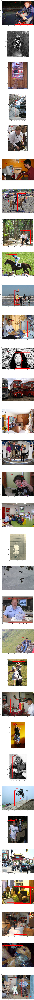

In [9]:
from src.data.VOC2012.plot import plot_grid_nms
num_predictions = 32
x_test = df_test.sample(num_predictions)


plot_ground_truth = False
plot_grid=False
nms_iou_threshold=0.5
conf_threshold = 0.5

if has_min_loss:
    subplots = 2
else:
    subplots=1

plt.subplots(num_predictions, subplots, figsize=(10, num_predictions*10))

pred = model.predict_generator(datagen.flow_test(x_test))
for i in range(num_predictions):
    plt.subplot(num_predictions, subplots, i*subplots+1)
    plot_grid_nms(x_test, x_test.index[i], np.array(pred[i][0]), config, plot_ground_truth=plot_ground_truth, plot_grid=plot_grid, conf_threshold=conf_threshold, iou_threshold=nms_iou_threshold)

if has_min_loss:
    pred_min_loss = model_min_loss.predict_generator(datagen.flow_test(x_test))
    for i in range(num_predictions):
        plt.subplot(num_predictions, subplots, i*subplots+2)
        plot_grid_nms(x_test, x_test.index[i], np.array(pred_min_loss[i][0]), config, plot_ground_truth=plot_ground_truth, plot_grid=plot_grid, conf_threshold=conf_threshold, iou_threshold=nms_iou_threshold) 
plt.show()